In [2]:
%pip install matplotlib seaborn numpy pandas nibabel nilearn scikit-learn statsmodels torch joblib networkx python-louvain
%pip install openpyxl
import os
import glob
import numpy as np

import pandas as pd
import nibabel as nib
from nilearn.input_data import NiftiLabelsMasker
import statsmodels.formula.api as smf
import torch
import torch.nn as nn
import torch.optim as optim
import re
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.preprocessing import LabelEncoder
from joblib import Parallel, delayed
%pip install scipy statsmodels
from scipy.stats import shapiro, levene
from sklearn.preprocessing import LabelEncoder
import networkx as nx
import community.community_louvain as community_louvain
from tqdm.auto import tqdm
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


/var/folders/cc/wd3_9b8j32nbljs4xhr4h4y00000gn/T/ipykernel_32241/2075539556.py:9: DeprecationWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  from nilearn.input_data import NiftiLabelsMasker



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


/opt/homebrew/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
window_dir    = Path("/Users/hetjivani/NIAR/Neuro-Imaging-Analysis-and-Research/GroupE/Final_Code/processed/windows")
labels_path   = Path("/Users/hetjivani/NIAR_Data/ModifiedDemoSCA7 Copy.xlsx")
selected_config = "w45_s15_rect"

In [4]:
def compute_network_measures(fc_matrix):
    G = nx.from_numpy_array(fc_matrix)
    dc   = np.mean(list(nx.degree_centrality(G).values()))
    ge   = nx.global_efficiency(G)
    cc   = nx.average_clustering(G, weight='weight')
    part = community_louvain.best_partition(G, weight='weight')
    mod  = community_louvain.modularity(part, G, weight='weight')
    return dc, ge, cc, mod

In [5]:
pattern = re.compile(
    r"^([pPcC]\d{2})_y(\d{2})_ts_"
    + re.escape(selected_config)
    + r"\.npy$"
)
records = []
for file in window_dir.glob(f"*{selected_config}.npy"):
    name = file.name
    m = pattern.match(name)
    if not m:
        print("❌ didn’t match:", name)
        continue
    print("✅ matched:", name)
    subj, year = m.groups()
    year = int(year)

    wins = np.load(file)
    fc_mats = np.array([np.corrcoef(win.T) for win in wins])
    mean_fc  = np.mean(fc_mats, axis=0)

    triu = np.triu_indices_from(mean_fc, k=1)
    fc_vec = mean_fc[triu]

    corr_net = np.where(mean_fc < 0, 0, mean_fc)
    dc, ge, cc, mod = compute_network_measures(corr_net)
    dFC_var = np.mean(np.var(fc_mats, axis=0))

    records.append((subj, year, fc_vec, dc, ge, cc, mod, dFC_var))

print(f"\nTotal records captured: {len(records)}")

✅ matched: p04_y02_ts_w45_s15_rect.npy
✅ matched: C04_y01_ts_w45_s15_rect.npy
✅ matched: p04_y03_ts_w45_s15_rect.npy
✅ matched: C04_y03_ts_w45_s15_rect.npy
✅ matched: C04_y02_ts_w45_s15_rect.npy
✅ matched: p04_y01_ts_w45_s15_rect.npy
✅ matched: p13_y01_ts_w45_s15_rect.npy
✅ matched: p13_y02_ts_w45_s15_rect.npy
✅ matched: p13_y03_ts_w45_s15_rect.npy
✅ matched: p10_y02_ts_w45_s15_rect.npy
✅ matched: p03_y01_ts_w45_s15_rect.npy
✅ matched: p10_y03_ts_w45_s15_rect.npy
✅ matched: p03_y03_ts_w45_s15_rect.npy
✅ matched: p03_y02_ts_w45_s15_rect.npy
✅ matched: p10_y01_ts_w45_s15_rect.npy
✅ matched: C08_y02_ts_w45_s15_rect.npy
✅ matched: p08_y01_ts_w45_s15_rect.npy
✅ matched: C07_y03_ts_w45_s15_rect.npy
✅ matched: p14_y03_ts_w45_s15_rect.npy
✅ matched: C08_y03_ts_w45_s15_rect.npy
✅ matched: p07_y01_ts_w45_s15_rect.npy
✅ matched: p14_y02_ts_w45_s15_rect.npy
✅ matched: C14_y01_ts_w45_s15_rect.npy
✅ matched: C07_y02_ts_w45_s15_rect.npy
✅ matched: C07_y01_ts_w45_s15_rect.npy
✅ matched: C14_y02_ts_w45

In [ ]:
subjects, years, fc_vecs, dcs, ges, ccs, mods, dfc_vars = zip(*records)
fc_arr = np.vstack(fc_vecs)
df = pd.DataFrame(fc_arr, columns=[f"f{i}" for i in range(fc_arr.shape[1])])
df["subject"]           = subjects
df["year"]              = years
df["degree_centrality"] = dcs
df["global_efficiency"] = ges
df["clustering_coeff"]  = ccs
df["modularity"]        = mods
df["dFC_variance"]      = dfc_vars

# ── 3) Load clinical Excel and normalize keys ─────────────────────────────
clinical = pd.read_excel(labels_path)
# ensure lowercase column names for safety
clinical.columns = clinical.columns.str.lower()
# rename subid → subject to match
clinical = clinical.rename(columns={"subid":"subject"})
# force types
clinical["subject"] = clinical["subject"].astype(str).str.lower()
clinical["year"]    = clinical["year"].astype(int)
for col in ["moca","mmse","cag","sara","p/c"]:
    if col in clinical.columns:
        clinical[col] = pd.to_numeric(clinical[col], errors="coerce")

# ── 4) Merge on both `subject` and `year` ─────────────────────────────────
df = df.merge(clinical, on=["subject","year"], how="left")

# ── 5) Label & group columns ───────────────────────────────────────────────
# if your clinical sheet has "p/c" for patients vs controls, rename it:
if "p/c" in df.columns:
    df = df.rename(columns={"p/c":"group"})
else:
    df["group"] = df["subject"].str.startswith("p").map({True:"p", False:"c"})

df["label_enc"] = LabelEncoder().fit_transform(df["group"].fillna("c"))
df["group"]     = df["label_enc"].map({0:"c",1:"p"})

In [7]:
df.to_csv(window_dir / "records.csv", index=False)
clinical.head()
df.shape


(84, 13711)

In [12]:
combined_df = pd.read_csv(window_dir / "records.csv")
combined_df.head

<bound method NDFrame.head of           f0        f1        f2        f3        f4        f5        f6  \
0  -0.185283  0.281391 -0.252403  0.281714 -0.295295  0.195074 -0.023607   
1  -0.092932  0.505045 -0.567318  0.574760 -0.175019  0.745987  0.295761   
2   0.354236  0.237840  0.073245  0.637071  0.282000  0.374756  0.218283   
3  -0.115733  0.396052  0.127046  0.532624  0.175769 -0.043925 -0.462018   
4   0.473043  0.007089 -0.266094  0.147617 -0.036762  0.078489  0.221702   
..       ...       ...       ...       ...       ...       ...       ...   
79  0.539316  0.022793 -0.011945 -0.174067 -0.297898  0.087227  0.193224   
80  0.491247  0.262484 -0.004757 -0.219176 -0.499075  0.259548 -0.381201   
81  0.534388  0.198510 -0.264853  0.505183 -0.067712  0.596531  0.342312   
82  0.527110  0.194156 -0.487754  0.083860 -0.153446  0.685238  0.170042   
83  0.251453  0.034953 -0.122872  0.167647 -0.118330  0.354399 -0.240511   

          f7        f8        f9  ...  dFC_variance   age

In [ ]:
# # 1) Use your existing 'year' column directly as the time variable
# combined_df['time'] = combined_df['year']

# # 2) Identify edge‐summary columns (adjust suffix if yours differ)
# edge_cols = [c for c in combined_df.columns if c.endswith('_mean')]

# # 3) Fit LME per edge and extract random‐effect intercepts & slopes
# import statsmodels.formula.api as smf
# import numpy as np
# import pandas as pd

# # Prepare dictionary to accumulate each subject's random effects
# lme_dict = {sid: {} for sid in combined_df['subject'].unique()}

# for edge in edge_cols:
#     # Subset and rename for ease
#     df_e = combined_df[['subject', 'time', edge]].rename(columns={edge: 'value'})
#     # Fit mixed‐effects model: value ~ time + (time | subject)
#     md  = smf.mixedlm("value ~ time", df_e, groups=df_e["subject"])
#     mdf = md.fit(reml=False)   # or reml=True as you prefer

#     # Extract random intercept & slope per subject
#     for subj, reff in mdf.random_effects.items():
#         lme_dict[subj][f"{edge}_int"]   = reff.get("Group", np.nan)
#         lme_dict[subj][f"{edge}_slope"] = reff.get("time",  np.nan)

# # 4) Convert to DataFrame and save
# lme_df = pd.DataFrame.from_dict(lme_dict, orient="index") \
#                    .reset_index() \
#                    .rename(columns={"index": "subject"})
# lme_df.to_csv("lme_random_effects.csv", index=False)

# # 5) (Optional) Quick diagnostics for the first few edges
# import matplotlib.pyplot as plt
# for edge in edge_cols[:3]:
#     df_e = combined_df[['subject','time',edge]].rename(columns={edge:'value'})
#     mdf  = smf.mixedlm("value ~ time", df_e, groups=df_e["subject"]).fit()
#     mdf.plot_diagnostics()
#     plt.suptitle(f"LME Diagnostics for {edge}")
#     plt.show()


In [52]:
# ── Strategy 1: Baseline imaging dataset (all subjects) ────────────────────
#   For LME: f ~ year + group + (1+year | subject)
baseline_cols = ["subject","year","group"] + \
                [c for c in df.columns if c.startswith("f")] + \
                ["degree_centrality","global_efficiency","clustering_coeff","modularity","dFC_variance"]
df_baseline = df[baseline_cols]
df_baseline.to_csv("baseline_imaging_dataset.csv", index=False)
print("✅ Saved baseline_imaging_dataset.csv")

# ── Strategy 3: Clinical modeling dataset (patients only) ─────────────────
#   For LME: f ~ year + SARA + MOCA + MMSE + CAG + (1+year | subject)
df_pat = df[df["group"]=="p"].dropna(subset=["sara","moca","mmse","cag"])
clinical_cols = ["sara","moca","mmse","cag"]
features = [c for c in df.columns if c.startswith("f")]
covars   = ["degree_centrality","global_efficiency","clustering_coeff","modularity","dFC_variance"]

df_clin = df_pat[["subject","year"] + clinical_cols + features + covars]
df_clin.to_csv("clinical_modeling_dataset.csv", index=False)
print("✅", len(df_clin), "rows written to clinical_modeling_dataset.csv")

✅ Saved baseline_imaging_dataset.csv
✅ 48 rows written to clinical_modeling_dataset.csv


In [53]:

# ── 0) Configuration ────────────────────────────────────────────────────────
baseline_csv = "/Users/hetjivani/NIAR/Neuro-Imaging-Analysis-and-Research/GroupE/Final_Code/baseline_imaging_dataset.csv"
clinical_csv = "/Users/hetjivani/NIAR/Neuro-Imaging-Analysis-and-Research/GroupE/Final_Code/clinical_modeling_dataset.csv"

# ── 1) Load data ───────────────────────────────────────────────────────────
df_base = pd.read_csv(baseline_csv)
df_clin = pd.read_csv(clinical_csv)

# ── 2) Define LME residual function ────────────────────────────────────────
def compute_lme_residuals(df, feats, formula_prefix, group_col="subject"):
    out = df.copy()
    diagnostics = []
    for f in feats:
        formula = f"{f} ~ {formula_prefix}"
        try:
            md  = smf.mixedlm(formula, out, groups=out[group_col], re_formula="~year")
            mdf = md.fit(reml=False, method="lbfgs")
            resid = out[f] - mdf.fittedvalues
            out[f"{f}_resid"] = resid

            # collect simple diag metrics
            diagnostics.append({
                "feature":       f,
                "converged":     mdf.converged,
                "aic":           mdf.aic,
                "bic":           mdf.bic,
                "llf":           mdf.llf
            })
        except Exception as e:
            print(f"[!]{f} failed: {e}")
            out[f"{f}_resid"] = np.nan
    diag_df = pd.DataFrame(diagnostics)
    return out, diag_df

# ── 3) Baseline imaging LME: f ~ year + group ──────────────────────────────
feat_cols         = [c for c in df_base.columns if c.startswith("f")]
baseline_prefix   = "year + group"
df_base_resid, diag_base = compute_lme_residuals(df_base, feat_cols, baseline_prefix)
df_base_resid.to_csv("baseline_residuals.csv", index=False)
diag_base["dataset"] = "baseline"
print("✅ Baseline residuals & diagnostics saved.")

# ── 4) Clinical LME: f ~ year + SARA + MOCA + MMSE + CAG ───────────────────
feat_cols_clin  = [c for c in df_clin.columns if c.startswith("f")]
clin_prefix     = "year + sara + moca + mmse + cag"
df_clin_resid, diag_clin = compute_lme_residuals(df_clin, feat_cols_clin, clin_prefix)
df_clin_resid.to_csv("clinical_residuals.csv", index=False)
diag_clin["dataset"] = "clinical"
print("✅ Clinical residuals & diagnostics saved.")

# ── 5) Combine diagnostics & export ────────────────────────────────────────
pd.concat([diag_base, diag_clin], ignore_index=True).to_csv("lme_diagnostics.csv", index=False)
print("✅ lme_diagnostics.csv saved.")


/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the paramete

✅ Baseline residuals & diagnostics saved.


/opt/homebrew/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 2.021393
  warnings.warn(msg, ConvergenceWarning)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the bou

✅ Clinical residuals & diagnostics saved.
✅ lme_diagnostics.csv saved.


In [57]:
df_base = pd.read_csv("baseline_residuals.csv")
df_clin = pd.read_csv("clinical_residuals.csv")
diag    = pd.read_csv("lme_diagnostics.csv")


/var/folders/cc/wd3_9b8j32nbljs4xhr4h4y00000gn/T/ipykernel_56241/52362070.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointplot(data=clin_m, x='year', y='value', hue='score', ci='sd', markers='o', dodge=True)


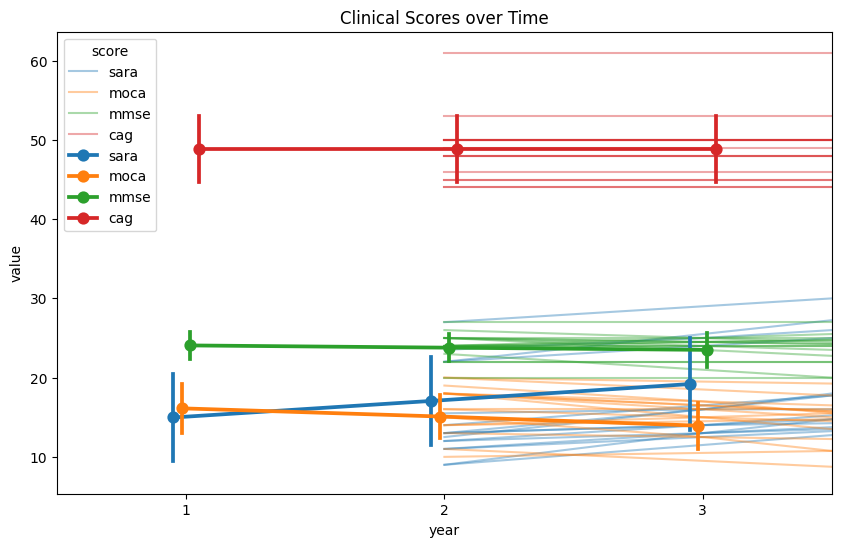

In [58]:
# Melt and plot each score over time
clin = df_clin[['subject','year','sara','moca','mmse','cag']].drop_duplicates()
clin_m = clin.melt(id_vars=['subject','year'], var_name='score', value_name='value')

plt.figure(figsize=(10,6))
sns.lineplot(data=clin_m, x='year', y='value', hue='score', estimator=None, units='subject', alpha=0.4)
sns.pointplot(data=clin_m, x='year', y='value', hue='score', ci='sd', markers='o', dodge=True)
plt.title("Clinical Scores over Time")
plt.show()


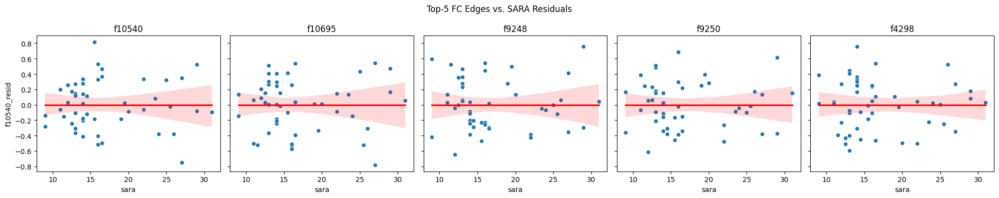

In [59]:
# find top‐5 edges by lowest p‐value from diagnostics
top5 = diag[diag.dataset=="clinical"].nsmallest(5, 'llf')['feature']

fig, axs = plt.subplots(1,5, figsize=(20,4), sharey=True)
for ax, feat in zip(axs, top5):
    sns.scatterplot(x='sara', y=f'{feat}_resid', data=df_clin, ax=ax)
    sns.regplot(x='sara', y=f'{feat}_resid', data=df_clin, ax=ax, scatter=False, color='red')
    ax.set_title(feat)
plt.suptitle("Top‐5 FC Edges vs. SARA Residuals")
plt.tight_layout()


In [62]:
# beta_years = []
# for f in feat_cols:
# 	try:
# 		md = smf.mixedlm(f"{f} ~ year + group", df_base, groups=df_base["subject"], re_formula="~year")
# 		mdf = md.fit(reml=False, method="lbfgs")
# 		beta_year = mdf.params.get("year", np.nan)
# 	except Exception as e:
# 		beta_year = np.nan
# 	beta_years.append(beta_year)

# # Add to diagnostics DataFrame
# diag_base = diag[diag.dataset=="baseline"].copy()
# diag_base["beta_year"] = beta_years

# beta = diag_base[['feature','beta_year']].set_index('feature')
# sns.clustermap(beta, cmap='vlag', standard_scale=1)
# plt.title("Yearly Slope Coefficients Across FC Edges (Baseline)")
# plt.show()
